<a href="https://colab.research.google.com/github/BhaskarKumarSinha/Ml-Deep-Learning-AI-Projects/blob/main/DeepLearningProject/Face_Resolution_Enhancement_with_UNET_Asg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face Super-Resolution using U-Net

This notebook demonstrates how to train a U-Net model for face super-resolution using the CelebA dataset. The goal is to take a low-resolution face image (64x64) and output a high-resolution version (256x256).

In [ ]:

!pip install -q kaggle tensorflow matplotlib keras opencv-python

# Step 1: Upload Kaggle API Key
from google.colab import files
files.upload() # Upload kaggle.json from your Kaggle account

# Step 2: Setup Kaggle Credentials
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Step 3: Download CelebA Dataset
!kaggle datasets download -d jessicali9530/celeba-dataset -p /content/
!unzip -q /content/celeba-dataset.zip -d /content/celeba-dataset


# Dataset path
data_dir = "/content/celeba-dataset/img_align_celeba/img_align_celeba/"


import os
print(f"Total images in dataset: {len(os.listdir(data_dir))}")

Saving kaggle (1).json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100% 1.33G/1.33G [00:13<00:00, 243MB/s]
100% 1.33G/1.33G [00:13<00:00, 105MB/s]
Total images in dataset: 202599


In [ ]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

from keras.models import Model
from keras.layers import Input, BatchNormalization, Activation, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from keras.optimizers import Adam
import tensorflow as tf

### U-Net Model (64x64 → 256x256) for Image Segmentation

This function defines a U-Net architecture that takes an input image of size **64×64×3** and outputs a **256×256×n_classes** segmentation map.  
The network follows the classic **encoder–decoder** structure with skip connections, along with two extra upsampling layers to reach 256×256 resolution.

---

#### 🔹 Encoder (Downsampling Path)
- Consists of four convolutional blocks (`c1`–`c4`).
- Each block has:
  - Two convolutional layers with ReLU activations and Batch Normalization.
  - A MaxPooling layer to reduce spatial dimensions.
  - Dropout for regularization.
- The number of filters doubles at each stage: 16 → 32 → 64 → 128.

---

#### 🔹 Bottleneck
- Two convolutional layers with **256 filters**.
- Serves as the deepest layer that captures semantic information.

---

#### 🔹 Decoder (Upsampling Path)
- Symmetrical to the encoder, using:
  - Transposed convolutions for upsampling.
  - Skip connections from the encoder layers (`c4 → u6`, `c3 → u7`, `c2 → u8`, `c1 → u9`).
  - Dropout and Batch Normalization after each convolution.

---

#### 🔹 Extra Upsampling
- Two additional transpose convolution blocks (`u10` and `u11`) are added to upscale from **64×64** back to **256×256**.

---

#### 🔹 Output Layer
- A `Conv2D` layer with **n_classes** filters (default = 3).
- Uses `sigmoid` activation by default, suitable for multi-class or multi-label segmentation.

---

#### 🔹 Compilation
- Optimizer: **Adam (learning rate = 1e-4)**  
- Loss function: **Mean Absolute Error (MAE)**  
- Model summary is printed for architecture details.

---

👉 This U-Net is useful for **super-resolution segmentation tasks**, where the input is smaller (64×64) but the output mask is larger (256×256).


In [ ]:
def unet_64to256(input_shape=(64, 64, 3), n_classes=3, final_activation='sigmoid', dropout_rate=0.05):
    inputs = Input(shape=input_shape, name='img')

    # Encoder
    c1 = Conv2D(16, (3,3), padding='same')(inputs)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding='same')(c1)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1); p1 = Dropout(dropout_rate)(p1)

    c2 = Conv2D(32, (3,3), padding='same')(p1)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding='same')(c2)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2); p2 = Dropout(dropout_rate)(p2)

    c3 = Conv2D(64, (3,3), padding='same')(p2)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding='same')(c3)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3); p3 = Dropout(dropout_rate)(p3)

    c4 = Conv2D(128, (3,3), padding='same')(p3)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding='same')(c4)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4); p4 = Dropout(dropout_rate)(p4)

    # Bottleneck
    c5 = Conv2D(256, (3,3), padding='same')(p4)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding='same')(c5)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)

    # Decoder
    u6 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(c5)
    u6 = concatenate([u6, c4]); u6 = Dropout(dropout_rate)(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)

    u7 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(u6)
    u7 = concatenate([u7, c3]); u7 = Dropout(dropout_rate)(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)

    u8 = Conv2DTranspose(32, (3,3), strides=(2,2), padding='same')(u7)
    u8 = concatenate([u8, c2]); u8 = Dropout(dropout_rate)(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)

    u9 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u8)
    u9 = concatenate([u9, c1]); u9 = Dropout(dropout_rate)(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)

    # Extra upsample to 256x256
    u10 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u9)
    u10 = Conv2D(16, (3,3), padding='same')(u10)
    u10 = BatchNormalization()(u10); u10 = Activation('relu')(u10)

    # Another upsample to 256x256
    u11 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u10)
    u11 = Conv2D(16, (3,3), padding='same')(u11)
    u11 = BatchNormalization()(u11); u11 = Activation('relu')(u11)


    outputs = Conv2D(n_classes, (1,1), activation=final_activation)(u11)
    return Model(inputs, outputs)

model = unet_64to256()
model.compile(optimizer=Adam(1e-4), loss='mae')
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ img (InputLayer)    │ (None, 64, 64, 3) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 64,    │        448 │ img[0][0]         │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │      2,320 │ activation[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 32,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 32, 32,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │      9,248 │ activation_2[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 16, 16,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                 

 Total params: 1,976,995 (7.54 MB)

 Trainable params: 1,974,467 (7.53 MB)

 Non-trainable params: 2,528 (9.88 KB)

### Data Generator Function (`datagen`)

This generator function creates batches of training data for the U-Net model.  
It continuously yields pairs of **low-resolution inputs (64×64)** and **high-resolution targets (256×256)** from the dataset.

---

#### 🔹 Workflow

1. **Load Image List**
   - Reads all image filenames from the directory `data_dir`.

2. **Infinite Loop**
   - Uses `while True:` so it can be fed directly into `model.fit()` without running out of data.

3. **Batch Creation**
   - For each batch (`batch_size = 16` by default):
     - Randomly select an image index.
     - Load the image using OpenCV (`cv.imread`).
     - Convert from **BGR → RGB** (`cv.cvtColor`).

4. **Preprocessing**
   - Create **input image**: resize to `64×64`, normalize to `[0,1]`.
   - Create **target image**: resize to `256×256`, normalize to `[0,1]`.

5. **Batch Accumulation**
   - Append processed images to lists `x_batch` and `y_batch`.

6. **Yield Batches**
   - Return NumPy arrays `(x_batch, y_batch)` for each iteration.

---

#### 🔹 Output Shapes
- **Input (x_batch):** `(batch_size, 64, 64, 3)`  
- **Target (y_batch):** `(batch_size, 256, 256, 3)`  

---

👉 This setup allows the model to learn how to transform **low-resolution inputs** into **high-resolution outputs**, making it suitable for tasks like **image super-resolution or segmentation upscaling**.


In [ ]:
def datagen(batch_size=16):
  imgs = os.listdir(data_dir)
  while True:
      x_batch, y_batch = [], []
      for _ in range(batch_size):
        idx = np.random.randint(0, len(imgs))
        path = os.path.join(data_dir, imgs[idx])
        bgr = cv.imread(path)
        rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)


        x = cv.resize(rgb, (64,64))/255.0
        y = cv.resize(rgb, (256,256))/255.0


        x_batch.append(x)
        y_batch.append(y)
      yield np.array(x_batch), np.array(y_batch)

### Model Training

We now train the U-Net model using the custom data generator.

---

#### 🔹 Training Setup
- **Batch Size:** `16`
- **Steps per Epoch:**  
  Computed as the total number of images divided by the batch size:  
  \[
  \text{steps\_per\_epoch} = \frac{\text{number of images in data\_dir}}{\text{batch size}}
  \]
  This ensures that each epoch processes the entire dataset once.

- **Epochs:** `3`  
  The model will complete 3 full passes over the dataset.

---

In [ ]:
batch_size = 16
steps_per_epoch=len(os.listdir(data_dir)) // batch_size
results = model.fit(datagen(batch_size), steps_per_epoch=steps_per_epoch, epochs=3)

Epoch 1/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 657s 49ms/step - loss: 0.0582
Epoch 2/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 625s 49ms/step - loss: 0.0291
Epoch 3/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 626s 49ms/step - loss: 0.0253


### Visualizing and Saving Model Predictions (`show_and_save_samples`)

This function helps monitor the model’s progress during training by displaying and saving sample predictions.

---

#### 🔹 Parameters
- **model:** Trained Keras model used for prediction.  
- **imgs:** List of image filenames from the dataset directory.  
- **base_dir:** (Unused here, but typically refers to dataset directory).  
- **epoch:** Current training epoch (used for saving the output file).  
- **n (default=5):** Number of random images to visualize.  
- **save_dir (default='./epoch_samples'):** Directory where sample images are saved.  

---

#### 🔹 Workflow
1. **Random Sampling**
   - Randomly selects `n` images from the dataset.

2. **Image Loading**
   - Reads the image from `data_dir` using OpenCV.
   - Converts BGR → RGB for correct visualization.

3. **Preprocessing**
   - Ground truth resized to `128×128` (`gt128`).
   - Low-resolution input resized to `64×64` (`img64`).
   - Low-resolution image upscaled to `128×128` for visualization (`lowup`).
   - Prediction generated by the model and compared with ground truth.

4. **Visualization**
   - Each selected image is displayed in a row with 4 columns:
     - **Original Image** (full resolution).  
     - **Ground Truth (128×128)**.  
     - **Low-Resolution Input (upscaled to 128×128)**.  
     - **Model Prediction**.  

5. **Saving**
   - The figure is saved to the directory `save_dir` with filename:
     ```
     epoch_XX.png
     ```
     where `XX` is the current epoch number.

---

In [ ]:
def show_and_save_samples(model, imgs, base_dir, epoch, n=5, save_dir='./epoch_samples'):
    os.makedirs(save_dir, exist_ok=True)
    chosen = np.random.choice(imgs, n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1: axes = np.expand_dims(axes, 0)

    for i, fname in enumerate(chosen):
        # Use the correct data_dir for constructing the image path
        path = os.path.join(data_dir, fname)
        rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
        gt128 = cv.resize(rgb, (128,128)).astype('float32')/255
        img64 = cv.resize(rgb, (64,64)).astype('float32')/255
        pred  = model.predict(np.expand_dims(img64,0), verbose=0)[0]
        lowup = cv.resize((img64*255).astype(np.uint8),(128,128))

        for ax, im, title in zip(axes[i],[rgb,gt128,lowup,pred],
                                 ['Original','GT 128x128','Low-Res','Prediction']):
            ax.imshow(im); ax.set_title(title); ax.axis('off')

    plt.tight_layout(); plt.savefig(f"{save_dir}/epoch_{epoch+1:02d}.png"); plt.show()

In [ ]:
imgs = os.listdir(data_dir)
base_dir = data_dir

In [ ]:
model.save('face_resolution_model.keras')

# --- Simple Callbacks ---
def on_epoch_end(epoch, logs):
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)

In [ ]:
# --- Simple Callbacks ---
def on_epoch_end(epoch, logs):
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)

##Training a model in a such a way that we can see every epoch image processing

Epoch 1/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0225

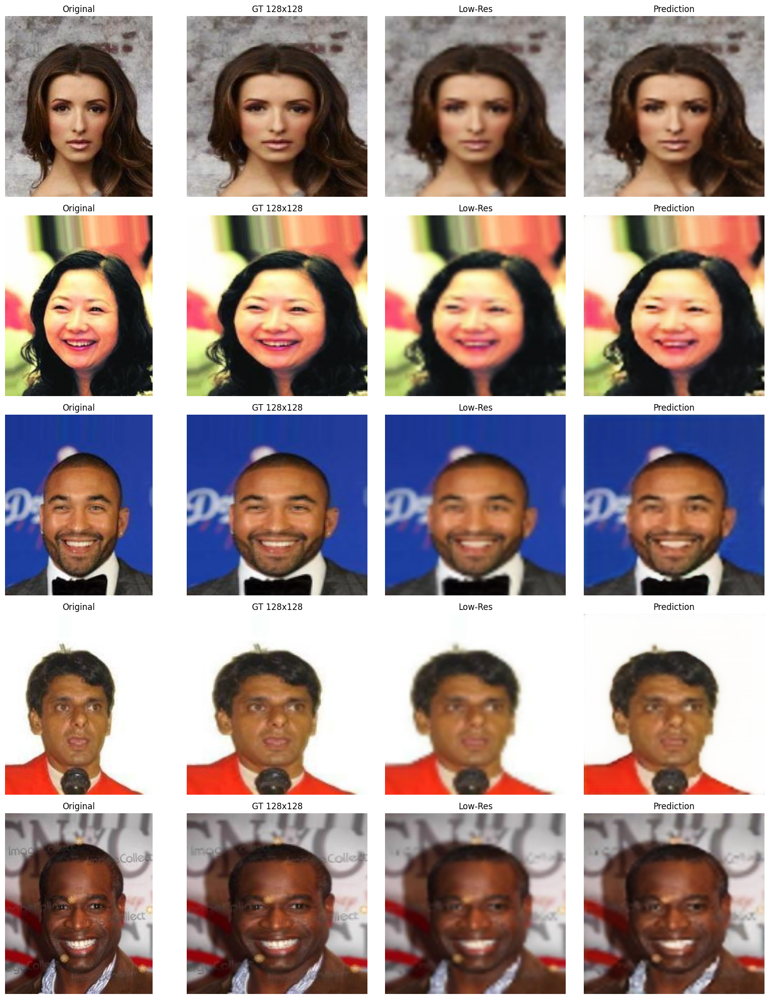

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 688s 105ms/step - loss: 0.0225
Epoch 2/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0220

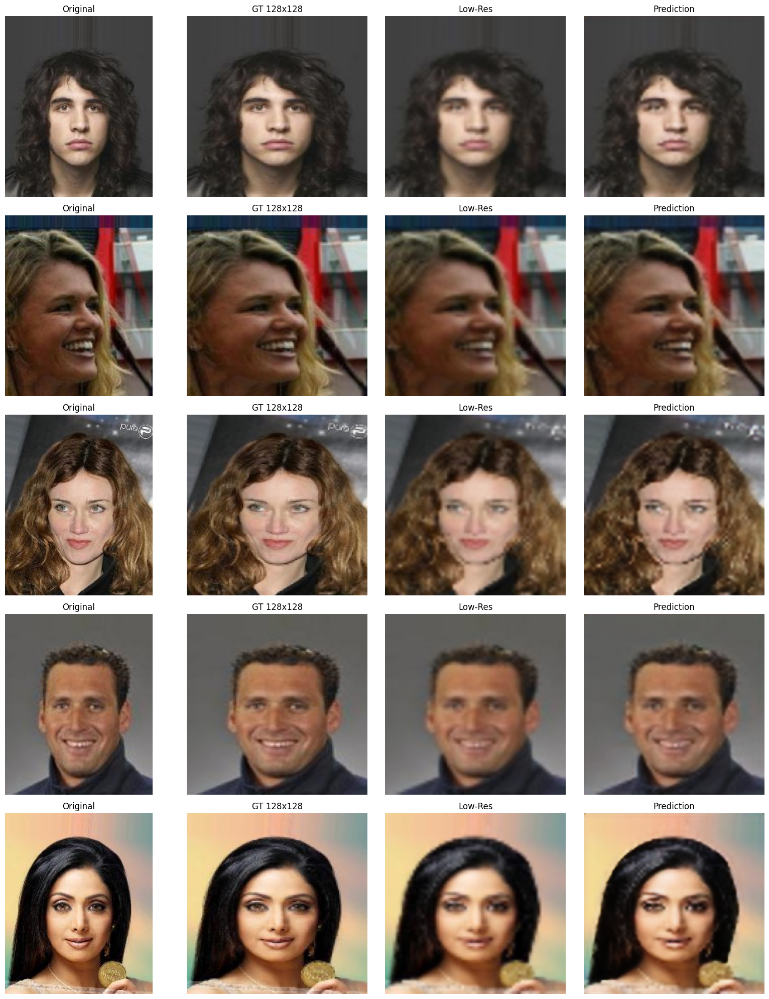

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 777s 123ms/step - loss: 0.0220
Epoch 3/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0217

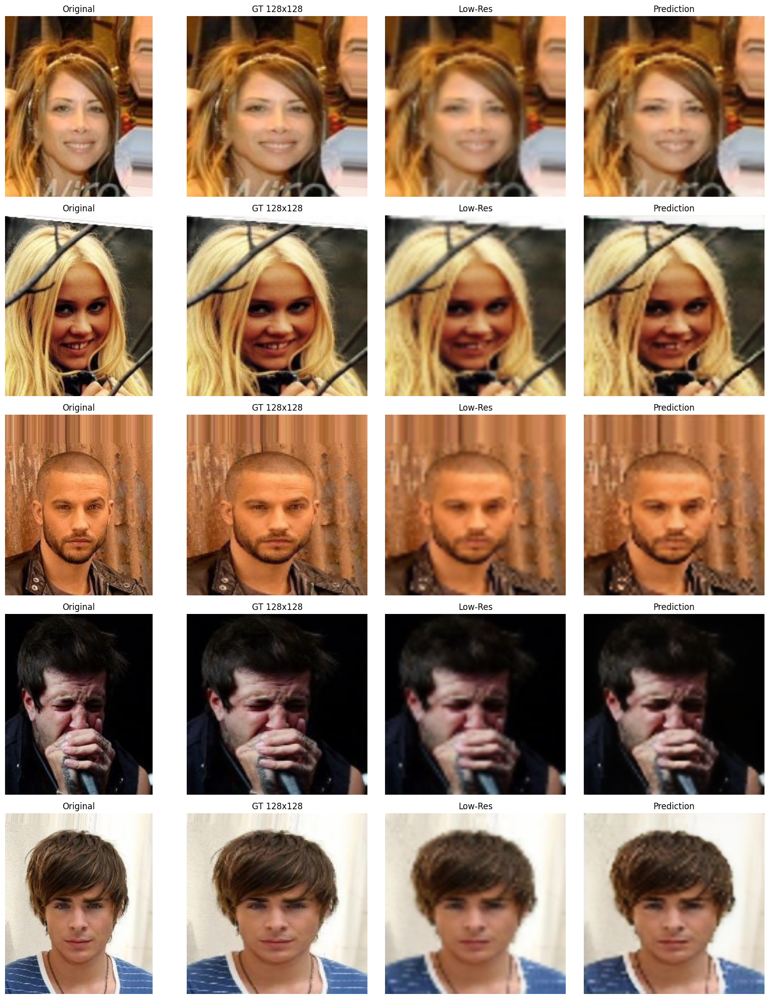

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 831s 131ms/step - loss: 0.0217


In [ ]:
# Updated training parameters
batch_size = 32
steps_per_epoch = len(os.listdir(data_dir))//batch_size
base_dir ="/content/celeba-dataset/img_align_celeba"
os.makedirs('./checkpoints', exist_ok=True)
results = model.fit(
    datagen(batch_size=batch_size),
    steps_per_epoch=steps_per_epoch,
    epochs=3,
    callbacks=[show_cb],
    verbose=1)


##Showing the sample image with differntiating between original and low resolution image


In [ ]:
|def show_samples(model, n=3):
    imgs_list = os.listdir(data_dir)
    chosen = np.random.choice(imgs_list, n)
    fig, axes = plt.subplots(n, 3, figsize=(12, 4*n))
    for i, fname in enumerate(chosen):
      path = os.path.join(data_dir, fname)
      rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
      img64 = cv.resize(rgb, (64,64))/255.0
      gt256 = cv.resize(rgb, (256,256))/255.0
      pred = model.predict(np.expand_dims(img64,0))[0]

      for ax, im, title in zip(axes[i], [img64, gt256, pred], ['Input 64x64','Ground Truth 256x256','Prediction']):
          ax.imshow(im)
          ax.set_title(title)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


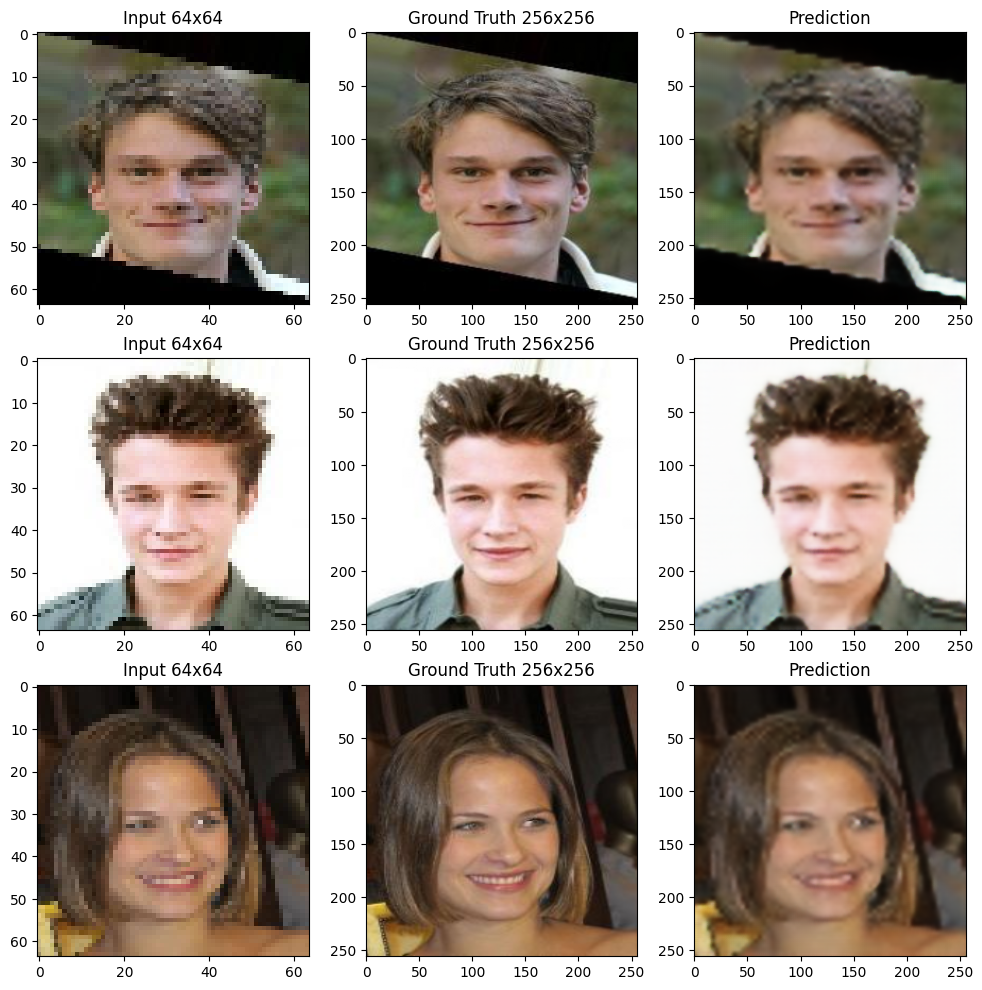

In [ ]:
show_samples(model)

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
loaded_model = load_model('face_resolution_model.keras')

In [ ]:
# Path to a new image (replace with your image path)
# For demonstration, let's use one of the images from the dataset and resize it to 64x64
import os
import cv2 as cv
import numpy as np

# Get a random image path from the dataset
imgs = os.listdir(data_dir)
random_img_path = os.path.join(data_dir, np.random.choice(imgs))

# Load and preprocess the image
new_image_bgr = cv.imread(random_img_path)
new_image_rgb = cv.cvtColor(new_image_bgr, cv.COLOR_BGR2RGB)
low_res_image = cv.resize(new_image_rgb, (64, 64)) / 255.0

# Add a batch dimension
low_res_image_input = np.expand_dims(low_res_image, axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


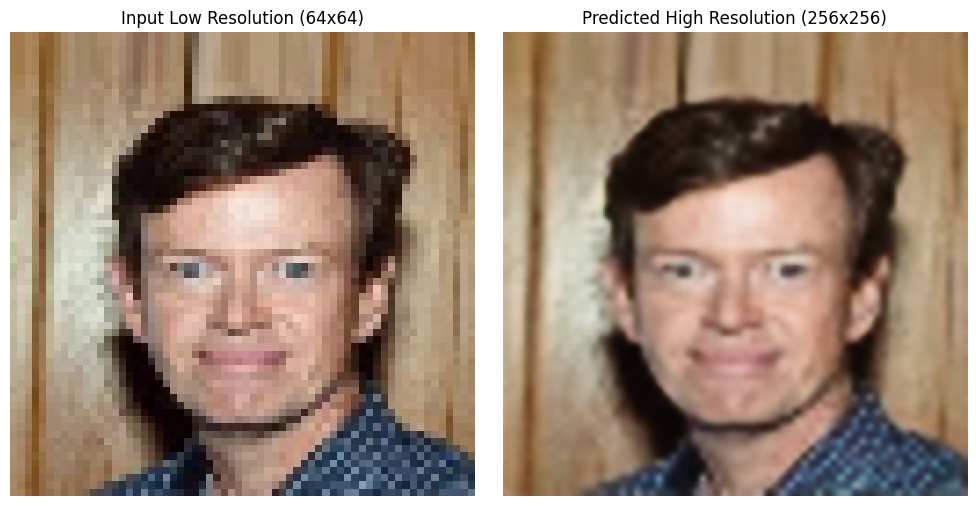

In [ ]:
# Make a prediction using the loaded model
predicted_high_res_image = loaded_model.predict(low_res_image_input)[0]

# Display the original low-resolution and predicted high-resolution images
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(low_res_image)
axes[0].set_title('Input Low Resolution (64x64)')
axes[0].axis('off')

axes[1].imshow(predicted_high_res_image)
axes[1].set_title('Predicted High Resolution (256x256)')
axes[1].axis('off')

plt.tight_layout()
plt.show()